## Explore Data

In [7]:
import pandas as pd

df = pd.read_csv("data/summer_survey_2024_cleaned.csv")

In [8]:
df_nums = df.select_dtypes(include='float')
df_objs = df.select_dtypes(include="object")

In [9]:
for col in df.columns:
    print(col + ": " + str(df[col].dtype))

time_taken: float64
gender: object
age: float64
region: object
urbanicity: object
education: object
would_vote_for: object
political_orientation: object
ethnicity: object
religion: object
factory_farms_animals_percentage: float64
factory_farms_chickens_percentage: float64
animal_ag_emissions_percentage: float64
uk_vegetarian_percentage: float64
uk_vegan_percentage: float64
switch_supermarket_cull_free_eggs: float64
wtp_bcc: float64
animal_welfare_important: float64
taste_over_welfare: float64
interest_trying_pb: float64
current_diet: object
current_diet_duration: object
reduce_meat_consumption_important: float64
tried_veg_ever: object
reasons_stop_veg: object
reasons_stay_veg: object
reduce_meat_future: float64
reduce_meat_next_yr: float64
reduce_red_meat_past_yr: object
motivation_reduce_red_meat: object
increased_animal_products_past_yr: object
religious_dietary_requirements: object
reduce_meat_health: float64
reduce_meat_taste: float64
reduce_meat_environment: float64
reduce_meat_an

In [10]:


demo_cols = ["time_taken",
"gender",
"age",
"region",
"urbanicity",
"education",
"would_vote_for",
"political_orientation",
"ethnicity",
"religion"
]

reduce_cols = df.filter(regex='biggest_pb_motivations_')


<Axes: >

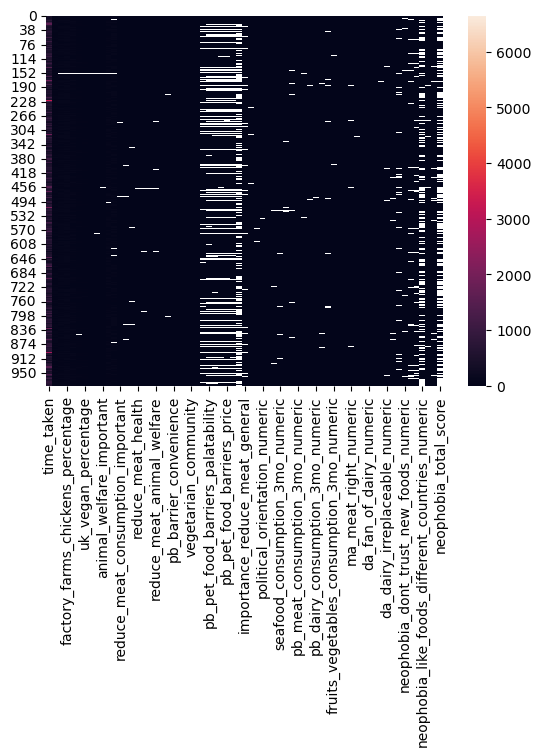

In [11]:
import seaborn as sns 
sns.heatmap(df_nums)

ValueError: The number of FixedLocator locations (0), usually from a call to set_ticks, does not match the number of labels (67).

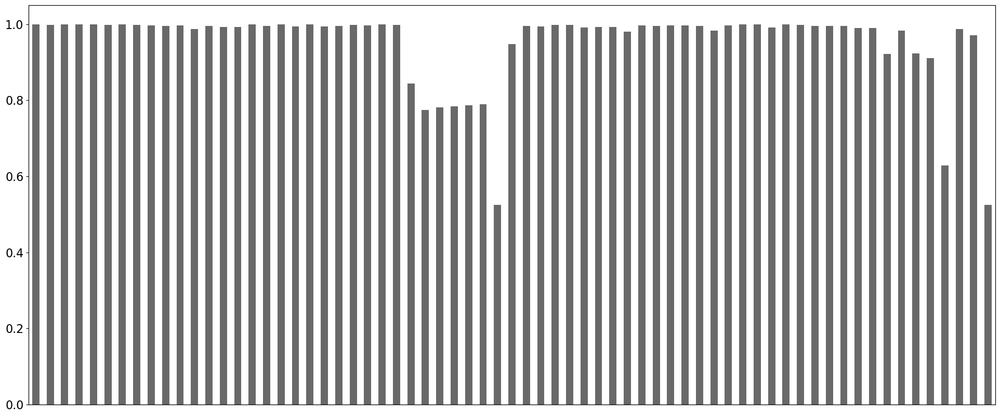

In [12]:
import missingno as msno

msno.bar(df_nums)


In [14]:
df_nums_drop_missing=df_nums[df_nums.columns[df_nums.isnull().mean() < 0.8]]

In [15]:
limitPer = len(df_nums) * .80
df_nums_drop_missing = df_nums.dropna(thresh=limitPer, axis=1)



ValueError: The number of FixedLocator locations (0), usually from a call to set_ticks, does not match the number of labels (59).

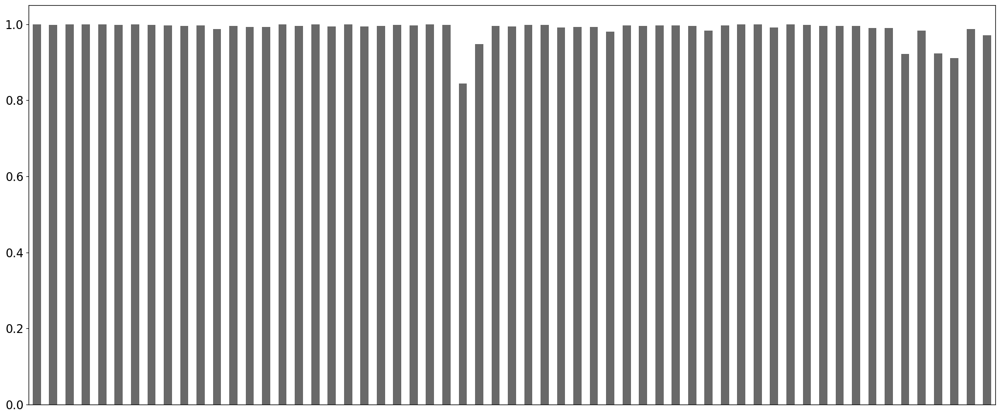

In [ ]:
msno.bar(df_nums_drop_missing)

In [16]:
df_nums_row_drop = df_nums_drop_missing.dropna()

In [17]:
len(df_nums_drop_missing)

984

In [18]:
len(df_nums_row_drop)

556

## Factor Analysis

Requirements 

- univariate and multivariate normality within the data
- It is also important that there is an absence of univariate and multivariate outliers Also, a determining factor is based on the assumption that there is a linear relationshipbetween the factors and the variables when computing the correlations (Gorsuch, 1983). For something to be labeled as a factor it should have at least 3 variables, although this depends on the design of the study (Tabachnick & Fidell, 2007). As a general guide, rotated factors that have 2 or fewer variables should be interpreted with caution. A factor with 2 variables is only considered reliable when the variables are highly correlated with each another (r > .70) but fairly uncorrelated with other variables.

- We normally say that the ratio of respondents to variables should be at least 10:1 and that the factors are considered to be stable and to cross-validate with a ratio of 30:1. 
- Next, the correlation r must be .30 or greater since anything lower would suggest a really weak relationship between the variables 
- It is important that you check for an absence of multicollinearity and singularity within your dataset by looking at the Squared Multiple Correlation (SMC; Tabachnick & Fidell, 2007). Variables that have issues with singularity (i.e., SMC close to 0) and multicollinearity (SMC close to 1.0) should be removed from your dataset.

In [19]:
float_df = df_nums_row_drop.select_dtypes('float64')


In [20]:
float_df.columns

Index(['time_taken', 'age', 'factory_farms_animals_percentage',
       'factory_farms_chickens_percentage', 'animal_ag_emissions_percentage',
       'uk_vegetarian_percentage', 'uk_vegan_percentage',
       'switch_supermarket_cull_free_eggs', 'wtp_bcc',
       'animal_welfare_important', 'taste_over_welfare', 'interest_trying_pb',
       'reduce_meat_consumption_important', 'reduce_meat_future',
       'reduce_meat_next_yr', 'reduce_meat_health', 'reduce_meat_taste',
       'reduce_meat_environment', 'reduce_meat_animal_welfare',
       'pb_barrier_price', 'pb_barrier_taste', 'pb_barrier_convenience',
       'pb_barrier_social_pressure', 'try_cultivated_meat',
       'vegetarian_community', 'vegan_community', 'open_pb_pet_food',
       'importance_reduce_meat_general', 'education_numeric', 'gender_numeric',
       'political_orientation_numeric', 'red_meat_consumption_3mo_numeric',
       'poultry_consumption_3mo_numeric', 'seafood_consumption_3mo_numeric',
       'dairy_consumption_3

In [ ]:
sns.pairplot(df_nums_row_drop)

In [ ]:
import pandas as pd
from sklearn.decomposition import FactorAnalysis

fa = FactorAnalysis(n_components=10) 
fa.fit(df_nums_row_drop)
loadings = fa.components_
scores = fa.transform(df_nums_row_drop)

# Print the factor loadings
print(loadings)

print(scores)

[[ 3.93999398e+02  2.53650502e+00  2.69878926e+00  2.13526450e+00
   1.09646476e+00  1.20360210e+00  8.64507023e-01  7.24261340e-02
   7.45189772e-02  7.56724054e-02 -1.97673392e+00  3.90137748e+00
   1.67322141e-01  1.44383458e-01  1.52126335e-01  3.65082113e-02
  -8.02208971e-02  1.43655264e-01  1.40633840e-01 -9.03932836e-03
  -7.37923948e-02 -8.22608431e-02  1.87841587e-02  2.01335320e-02
   1.93214434e-01  1.78784691e-01  8.00243788e-02  1.24306933e-01
   5.15541766e-02 -3.61778470e-02 -1.01507773e-01 -1.80401171e-02
  -3.21147261e-02  9.08148296e-02  1.20918844e-01  1.65363575e-01
   1.25507536e-01  3.44198789e-02  1.93878333e-02  6.13949700e-02
   4.64936715e-02  1.22309445e-01  1.96651846e-01 -7.72893354e-02
  -7.92463614e-02 -1.17593947e-02 -7.67131956e-02 -9.64196723e-02
   3.84014750e-02 -3.93184720e-02 -9.98703772e-03 -2.36186686e-03
   4.48939413e-02 -1.63542164e-02  4.19694609e-02  4.17707310e-03
   3.31134733e-02 -3.41427959e-01  3.16280396e-02]
 [-3.44915315e-01 -8.9165